In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns 
import datetime as dt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('une_rt_m.tsv', delimiter='\t')

In [3]:
country_codes_df = pd.read_csv("wikipedia-iso-country-codes.csv")
country_codes_df.columns = ['country', 'C2', 'C3', 'numeric', 'iso']

In [4]:
# Separate from the first column various data attributes (country, age, unit, sex, s_adj) by splitting complex data and store them in individual columns
df['C2'] = df['s_adj,age,unit,sex,geo\\time'].apply(lambda x: x.split(',')[-1])
df['age'] = df['s_adj,age,unit,sex,geo\\time'].apply(lambda x: x.split(',')[1])
df['unit'] = df['s_adj,age,unit,sex,geo\\time'].apply(lambda x: x.split(',')[2])
df['sex'] = df['s_adj,age,unit,sex,geo\\time'].apply(lambda x: x.split(',')[3])
df['s_adj'] = df['s_adj,age,unit,sex,geo\\time'].apply(lambda x: x.split(',')[0])

In [5]:
# Checking the dataset after modifications
df.head()
print(f"countries:\n{list(df.C2.unique())}")
print(f"sex:\n{list(df.sex.unique())}")
print(f"age intervals:\n{list(df.age.unique())}")
print(f"unit:\n{list(df.unit.unique())}")
print(f"s_adj:\n{list(df.s_adj.unique())}")

countries:
['AT', 'BE', 'BG', 'CH', 'CY', 'CZ', 'DE', 'DK', 'EA', 'EA18', 'EA19', 'EE', 'EL', 'ES', 'EU25', 'EU27_2007', 'EU27_2020', 'EU28', 'FI', 'FR', 'HR', 'HU', 'IE', 'IS', 'IT', 'JP', 'LT', 'LU', 'LV', 'MT', 'NL', 'NO', 'PL', 'PT', 'RO', 'SE', 'SI', 'SK', 'UK', 'US', 'TR']
sex:
['F', 'M', 'T']
age intervals:
['TOTAL', 'Y25-74', 'Y_LT25']
unit:
['PC_ACT', 'THS_PER']
s_adj:
['NSA', 'SA', 'TC']


In [6]:
# Selecting country code, age, unit, sex, s_adj and months from Jan 2015 and June 2020


selected_cols = ['C2','age','unit','sex', 's_adj', 
                 '2020M07 ', '2020M06 ', '2020M05 ', '2020M04 ','2020M03 ','2020M02 ','2020M01 ',
                 '2019M12 ','2019M11 ','2019M10 ','2019M09 ','2019M08 ','2019M07 ',
                 '2019M06 ','2019M05 ','2019M04 ','2019M03 ','2019M02 ','2019M01 ',
                '2018M12 ','2018M11 ','2018M10 ','2018M09 ','2018M08 ','2018M07 ',
                 '2018M06 ','2018M05 ','2018M04 ','2018M03 ','2018M02 ','2018M01 ',
                '2017M12 ','2017M11 ','2017M10 ','2017M09 ','2017M08 ','2017M07 ',
                 '2017M06 ','2017M05 ','2017M04 ','2017M03 ','2017M02 ','2017M01 ',
                '2016M12 ','2016M11 ','2016M10 ','2016M09 ','2016M08 ','2016M07 ',
                 '2016M06 ','2016M05 ','2016M04 ','2016M03 ','2016M02 ','2016M01 ',
                '2015M12 ','2015M11 ','2015M10 ','2015M09 ','2015M08 ','2015M07 ',
                 '2015M06 ','2015M05 ','2015M04 ','2015M03 ','2015M02 ','2015M01 ']



data_sel_df = df[selected_cols]



In [7]:
# Merging with country codes
data_sel_df = data_sel_df.merge(country_codes_df, on='C2')
data_sel_df.head()


,C2,age,unit,sex,s_adj,2020M07,2020M06,2020M05,2020M04,2020M03,...,2015M06,2015M05,2015M04,2015M03,2015M02,2015M01,country,C3,numeric,iso
0,AT,TOTAL,PC_ACT,F,NSA,6.0,6.2,5.2,4.9,4.7,...,5.2,5.6,5.4,5.2,5.6,5.2,Austria,AUT,40,ISO 3166-2:AT
1,AT,TOTAL,PC_ACT,M,NSA,5.5,6.2,6.1,5.2,5.0,...,6.0,6.1,6.6,6.6,6.2,6.0,Austria,AUT,40,ISO 3166-2:AT
2,AT,TOTAL,PC_ACT,T,NSA,5.7,6.2,5.7,5.1,4.9,...,5.6,5.8,6.0,5.9,5.9,5.6,Austria,AUT,40,ISO 3166-2:AT
3,AT,TOTAL,THS_PER,F,NSA,129,132,108,100,97,...,106,114,109,105,113,106,Austria,AUT,40,ISO 3166-2:AT
4,AT,TOTAL,THS_PER,M,NSA,134,149,144,121,118,...,141,140,152,151,141,136,Austria,AUT,40,ISO 3166-2:AT


In [8]:
print(f"selected data shape: {data_sel_df.shape}")

selected data shape: (1645, 76)


In [9]:
data_sel_df.reset_index()

,index,C2,age,unit,sex,s_adj,2020M07,2020M06,2020M05,2020M04,...,2015M06,2015M05,2015M04,2015M03,2015M02,2015M01,country,C3,numeric,iso
0,0,AT,TOTAL,PC_ACT,F,NSA,6.0,6.2,5.2,4.9,...,5.2,5.6,5.4,5.2,5.6,5.2,Austria,AUT,40,ISO 3166-2:AT
1,1,AT,TOTAL,PC_ACT,M,NSA,5.5,6.2,6.1,5.2,...,6.0,6.1,6.6,6.6,6.2,6.0,Austria,AUT,40,ISO 3166-2:AT
2,2,AT,TOTAL,PC_ACT,T,NSA,5.7,6.2,5.7,5.1,...,5.6,5.8,6.0,5.9,5.9,5.6,Austria,AUT,40,ISO 3166-2:AT
3,3,AT,TOTAL,THS_PER,F,NSA,129,132,108,100,...,106,114,109,105,113,106,Austria,AUT,40,ISO 3166-2:AT
4,4,AT,TOTAL,THS_PER,M,NSA,134,149,144,121,...,141,140,152,151,141,136,Austria,AUT,40,ISO 3166-2:AT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1640,1640,TR,TOTAL,THS_PER,T,TC,:,:,4143,4029,...,3060,3031,2997,3004,3014,3017,Turkey,TUR,792,ISO 3166-2:TR
1641,1641,TR,Y25-74,PC_ACT,T,TC,:,:,11.8,11.5,...,8.6,8.6,8.5,8.6,8.6,8.6,Turkey,TUR,792,ISO 3166-2:TR
1642,1642,TR,Y25-74,THS_PER,T,TC,:,:,3007,2907,...,2138,2120,2093,2092,2094,2099,Turkey,TUR,792,ISO 3166-2:TR
1643,1643,TR,Y_LT25,PC_ACT,T,TC,:,:,27.0,26.7,...,18.6,18.6,18.6,18.8,18.8,18.8,Turkey,TUR,792,ISO 3166-2:TR


In [10]:
# Using melt to pivot time series columns. For each value of time series we introduce additional rows
data_tr_df = data_sel_df.melt(id_vars=['age', 'unit', 'sex', 's_adj', 'C2', 'country'], var_name='Date', value_name='Value')

In [11]:
print(f"new data shape: {data_tr_df.shape}")

new data shape: (115150, 8)


In [24]:
# Changing column Value to string type
data_tr_df['Value'] = data_tr_df['Value'].astype('str')

In [25]:
# Clean the time series data by filtering non-digit data and trim spaces
import re
data_tr_df['Value'] = data_tr_df['Value'].apply(lambda x: re.sub(r"[a-zA-Z: ]", "", x))
data_tr_df['Value'] = data_tr_df['Value'].apply(lambda x: x.replace(" ",""))

data_tr_df = data_tr_df.loc[~(data_tr_df.Value=="")]

data_tr_df['Value'] = data_tr_df['Value'].apply(lambda x: float(x))

<ipython-input-25-96b080474a19>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_tr_df['Value'] = data_tr_df['Value'].apply(lambda x: float(x))


In [27]:
# Checking results
print(f"distinct values: {len(list(data_tr_df['Value'].unique()))}")
print(f"samples values: {data_tr_df['Value'].unique()}")

distinct values: 3948
samples values: [6.000e+00 5.500e+00 5.700e+00 ... 3.346e+03 6.243e+03 3.259e+03]


In [50]:
# Data visualization

# Looking at total values for age interval 25-74

total_y25_74_df = data_tr_df.loc[(data_tr_df.age=='Y25-74') & (data_tr_df.unit=='PC_ACT') & (data_tr_df.sex=='T') & (data_tr_df.s_adj=='TC') & (data_tr_df.Date!='numeric')]

In [32]:
def plot_time_variation(df, y='Value', size=1, is_log=False, title=''):
  f, ax = plt.subplots(1, 1, figsize=(4*size, 3*size))

  countries = list(df.country.unique())

  for country in countries:
    df_ = df[(df['country'] == country)]
    g = sns.lineplot(x='Date', y=y, data=df_, label=country)
    ax.text(max(df_['Date']), (df_.loc[df_['Date']==max(df_['Date']), y]), str(country))
  
  plt.xticks(rotation=90)
  plt.title(f'Total unemployment, {title}, grouped by country')
  ax.text(max(df_['Date']), (df_.loc[df_['Date']==max(df_['Date']), y]), str(country))
  plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

  if (is_log):
    ax.set(yscale='log')
  
  ax.grid(color='black', linestyle='dotted', linewidth=0.75)
  plt.show()

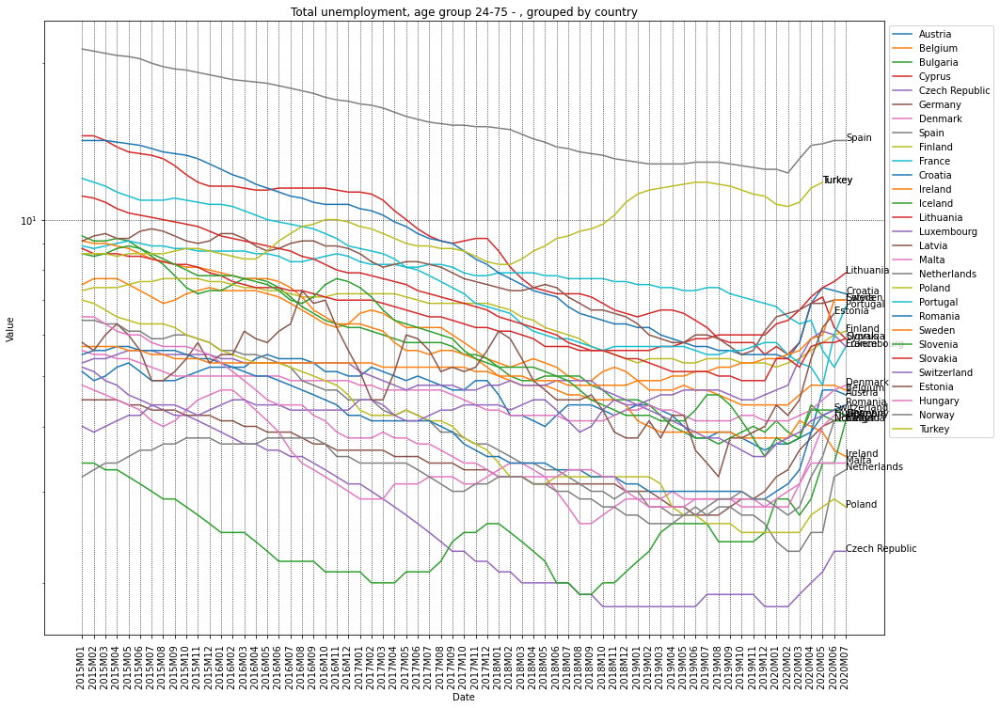

In [51]:
plot_time_variation(total_y25_74_df, size=4, is_log=True, title='age group 24-75 - ')

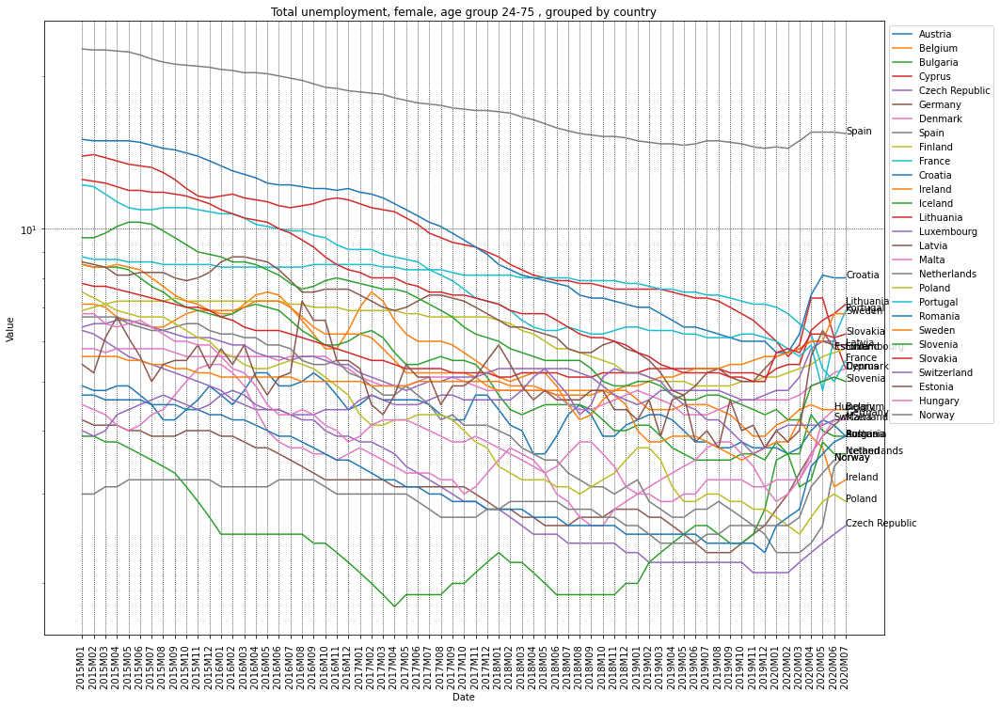

In [49]:
total_F_y25_74_df = data_tr_df.loc[(data_tr_df.age=='Y25-74') & (data_tr_df.unit=='PC_ACT') & (data_tr_df.sex=='F') & (data_tr_df.s_adj=='TC') & (data_tr_df.Date!='numeric')]
plot_time_variation(total_F_y25_74_df, size=4, is_log=True, title='female, age group 24-75 ')

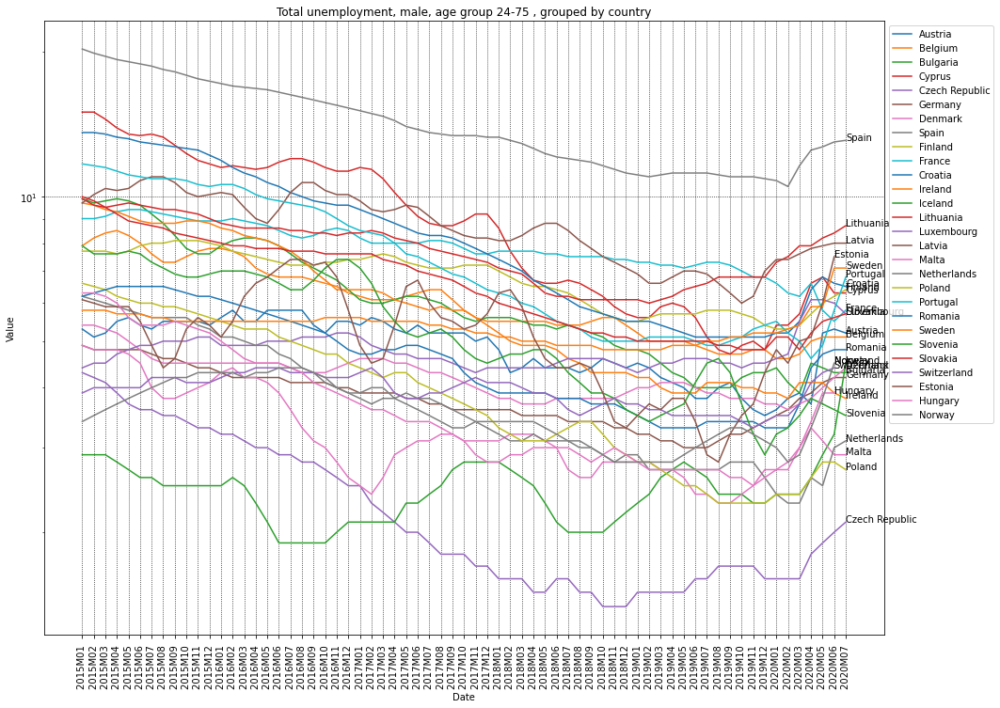

In [48]:
total_M_y25_74_df = data_tr_df.loc[(data_tr_df.age=='Y25-74') & (data_tr_df.unit=='PC_ACT') & (data_tr_df.sex=='M') & (data_tr_df.s_adj=='TC') & (data_tr_df.Date!='numeric')]
plot_time_variation(total_M_y25_74_df, size=4, is_log=True, title='male, age group 24-75 ')

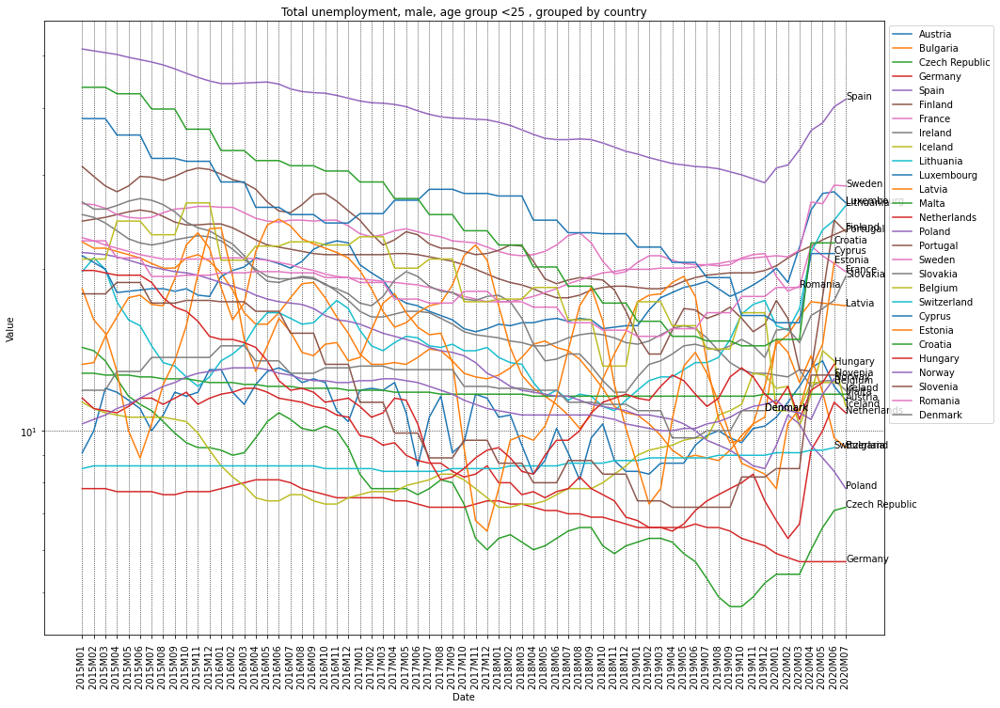

In [47]:
total_M_y25_df = data_tr_df.loc[(data_tr_df.age=='Y_LT25') & (data_tr_df.unit=='PC_ACT') & (data_tr_df.sex=='M') & (data_tr_df.s_adj=='TC') & (data_tr_df.Date!='numeric')]
plot_time_variation(total_M_y25_df, size=4, is_log=True, title='male, age group <25 ')

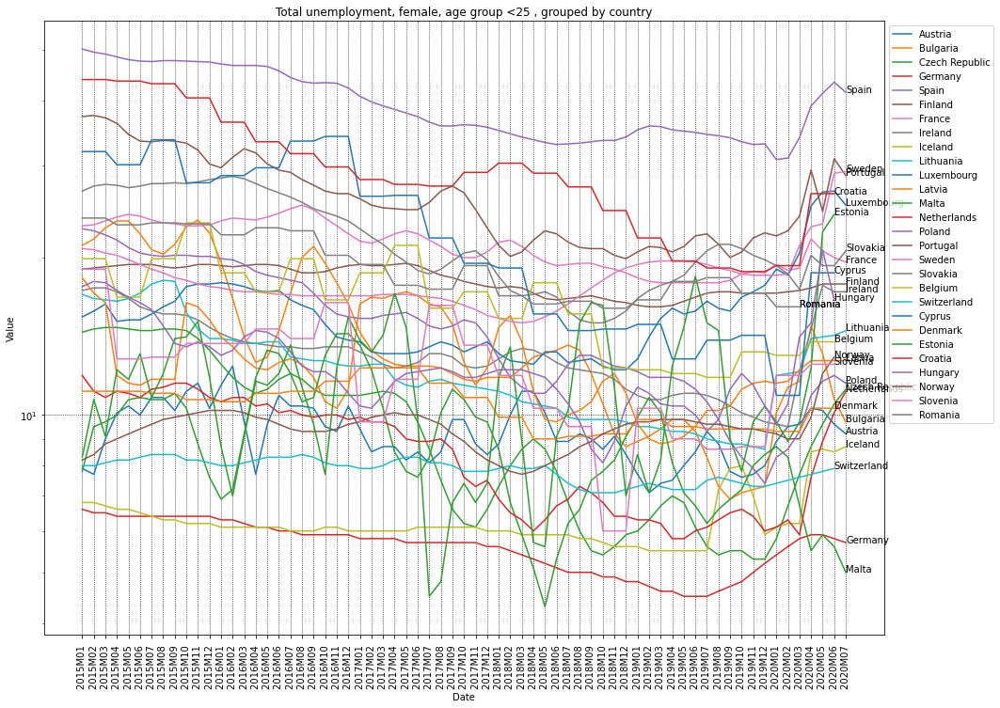

In [46]:
total_F_y25_df = data_tr_df.loc[(data_tr_df.age=='Y_LT25') & (data_tr_df.unit=='PC_ACT') & (data_tr_df.sex=='F') & (data_tr_df.s_adj=='TC') & (data_tr_df.Date!='numeric')]
plot_time_variation(total_F_y25_df, size=4, is_log=True, title='female, age group <25 ')

In [54]:
# Comparing age group, sex / country

def plot_time_variation_age_sex(data_tr_df, y='Value', country='Netherlands'):
  c_df = data_tr_df.loc[(data_tr_df.country == country) & (data_tr_df.unit == 'PC_ACT') & (data_tr_df.s_adj == 'TC') & (data_tr_df.Date!='numeric')]
  f, ax = plt.subplots(1, 1, figsize=(16, 12))
  sns.lineplot(x='Date', y=y, data=c_df.loc[(c_df.age=='Y_LT25') & (c_df.sex=='F')], label='Female, <25y')
  sns.lineplot(x='Date', y=y, data=c_df.loc[(c_df.age=='Y_LT25') & (c_df.sex=='M')], label='Male, <25y')
  sns.lineplot(x='Date', y=y, data=c_df.loc[(c_df.age=='Y25-74') & (c_df.sex=='F')], label='Female, 25-74y')
  sns.lineplot(x='Date', y=y, data=c_df.loc[(c_df.age=='Y25-74') & (c_df.sex=='M')], label='Male, 25-74y')

  plt.xticks(rotation=90)
  plt.title(f'Total unemploymend in {country}, grouped by age and sex')
  plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
  ax.grid(color='black', linestyle='dotted', linewidth=0.75)
  plt.show()

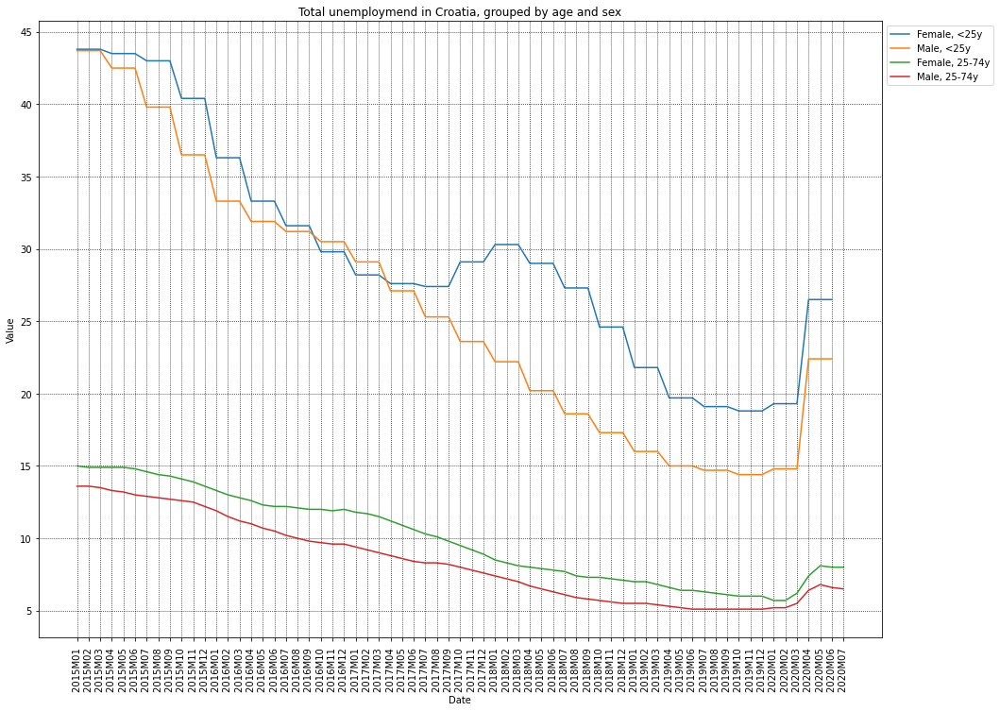

In [56]:
plot_time_variation_age_sex(data_tr_df, country='Croatia')

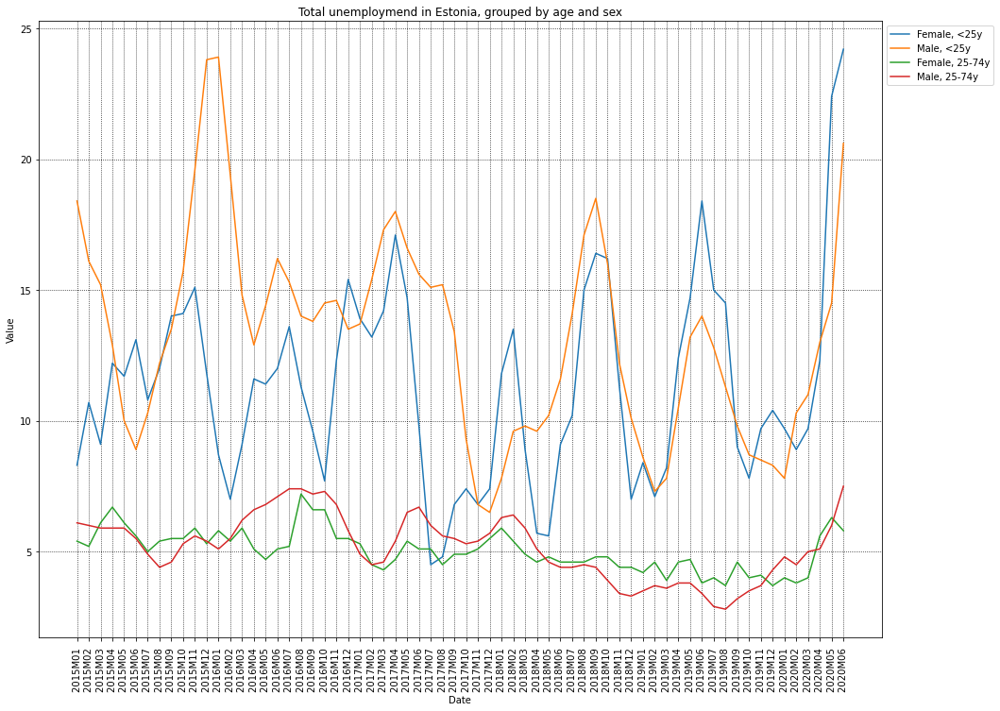

In [62]:
plot_time_variation_age_sex(data_tr_df, country='Estonia')

In [71]:
# Animated maps

def plot_animated_map(dd_df, title):
  hover_text = []

  for index, row in dd_df.iterrows():
    hover_text.append((f'country: {row["country"]}<br>unemployment: {row["Value"]}%'))
  dd_df['hover_text'] = hover_text

  fig = px.choropleth(dd_df,
                      locations='C2',
                      hover_name='hover_text',
                      color='Value',
                      animation_frame='Date',
                      projection='natural earth',
                      color_continuous_scale=px.colors.sequential.Plasma,
                      width=600, height=600)
  fig.update_geos(
    showcoastlines=True, coastlinecolor='DarkBlue',
    showland=True, landcolor='LightGrey',
    showocean=True, oceancolor='LightBlue',
    showlakes=True, lakecolor='Blue',
    showrivers=True, rivercolor='Blue',
    showcountries=True, countrycolor='DarkBlue'
  )
  fig.update_layout(title=title, geo_scope='europe')
  fig.show('notebook')


In [69]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

In [72]:
c_df = data_tr_df.loc[(data_tr_df.unit=='PC_ACT') & (data_tr_df.s_adj=='TC')]
dd_df = c_df.loc[(c_df.age=='Y_LT25') & (c_df.sex=='F')]
dd_df = dd_df.sort_values(by='Date')
title = 'Percent of unemployed per country<br>Female, under 25 - (hover for details)'
plot_animated_map(dd_df, title)

In [73]:
c_df = data_tr_df.loc[(data_tr_df.unit=='PC_ACT')&(data_tr_df.s_adj=='TC')]
dd_df=c_df.loc[(c_df.age=='Y_LT25')&(c_df.sex=='M')]
dd_df = dd_df.sort_values(by='Date')
title = 'Percent of unemployed per country<br>Male, under 25 - (hover for details)'
plot_animated_map(dd_df, title)

In [74]:
c_df = data_tr_df.loc[(data_tr_df.unit=='PC_ACT')&(data_tr_df.s_adj=='TC')]
dd_df=c_df.loc[(c_df.age=='Y25-74')&(c_df.sex=='M')]
dd_df = dd_df.sort_values(by='Date')
title = 'Percent of unemployed per country<br>Male, 25-74 yrs. old - (hover for details)'
plot_animated_map(dd_df, title)

